## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Step I. I'll compute the camera calibration using chessboard images

### I.1. Find chessboard coners and draw the detected chessboard coners

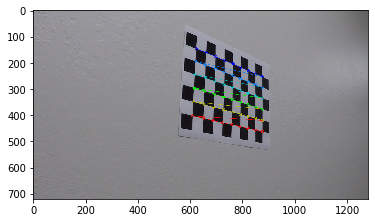

In [2]:
import os
import glob

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# %matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
img_paths = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners

output_images_dir = './output_images'
output_chessboard_coners = os.path.join(output_images_dir, 'chessboard_conners')
if not os.path.isdir(output_chessboard_coners):
    os.makedirs(output_chessboard_coners)
for img_path_ in img_paths:
    img_fn = os.path.basename(img_path_)[:-4]
    img = mpimg.imread(img_path_)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)
        # Save image with chessboard coners to the output_images folder
        plt.imsave(os.path.join(output_chessboard_coners, 'chessboard_{}.jpg'.format(img_fn)), img)

### I.2. Find the intrinsic parameters and extrinsics parameters of the camera

In [3]:
output_undistorted_img = os.path.join(output_images_dir, 'undistorted')
if not os.path.isdir(output_undistorted_img):
    os.makedirs(output_undistorted_img)
    
w, h = 1280, 720
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (w, h),None,None)

## Step II. Apply a distortion correction to raw images.

In [4]:
def undistort(img, mtx, dist):
    undistorted_img = cv2.undistort(img, mtx, dist, None, mtx)
    return undistorted_img

Undistorted images from calibration list

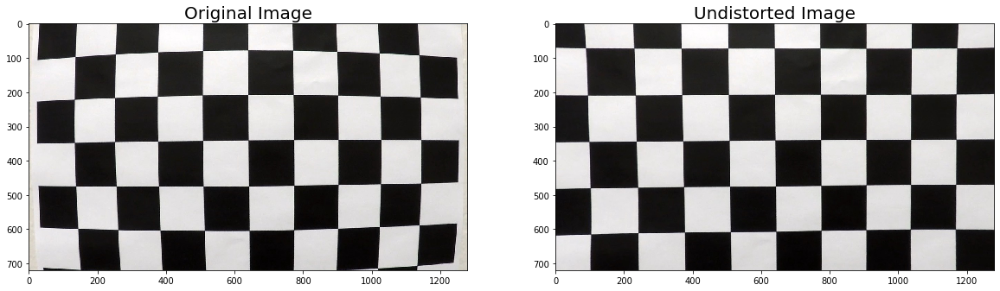

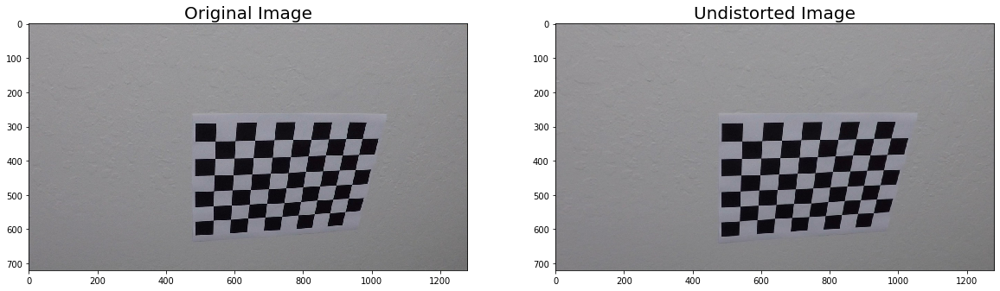

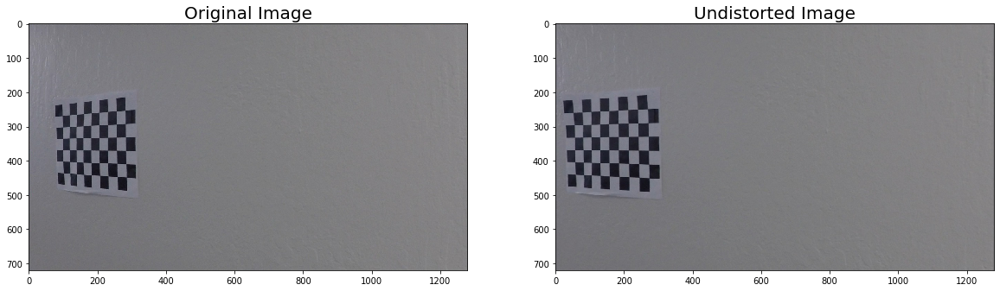

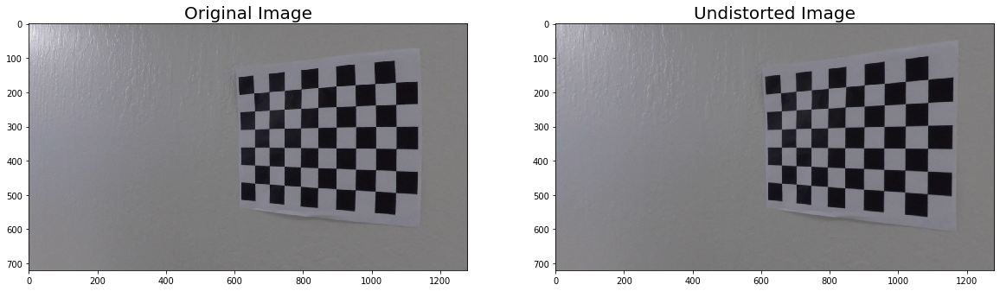

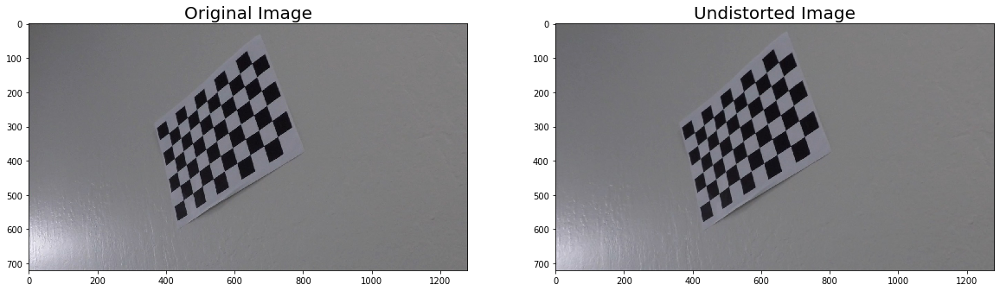

...

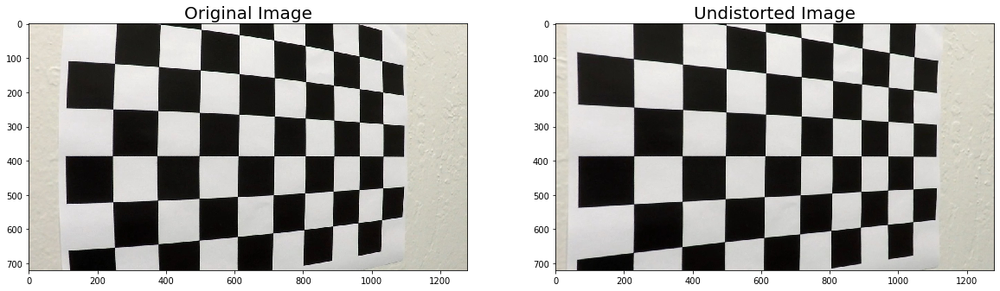

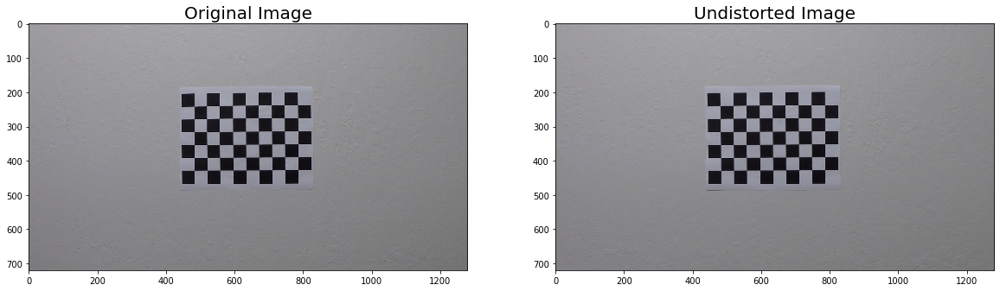

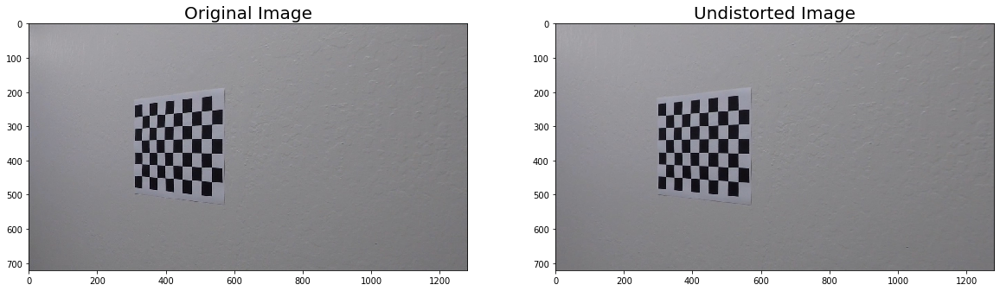

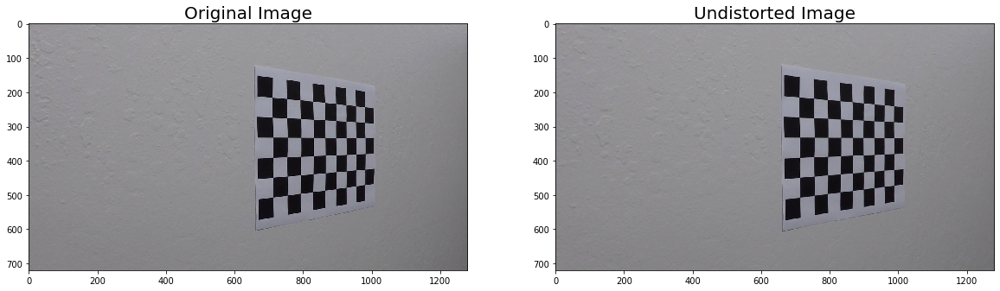

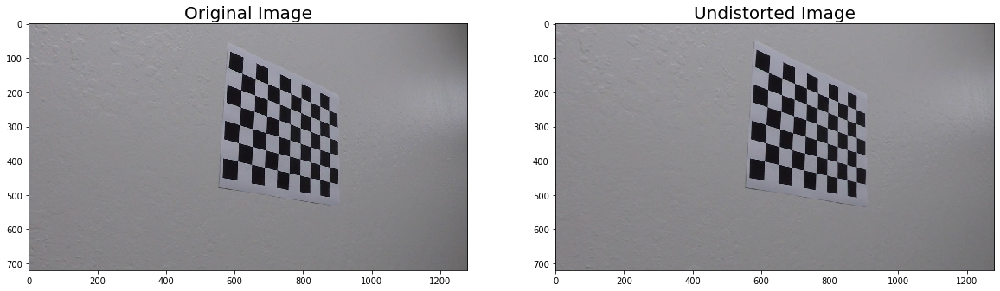

In [5]:
img_paths = glob.glob('./camera_cal/calibration*.jpg')
for img_path_ in img_paths:
    img_fn = os.path.basename(img_path_)[:-4]
    img = mpimg.imread(img_path_)
    undistorted_img = undistort(img, mtx, dist)
    
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistorted_img)
    ax2.set_title('Undistorted Image', fontsize=20)
    plt.savefig(os.path.join(output_undistorted_img, 'undistorted_{}.jpg'.format(img_fn)))

Undistorted images from test images

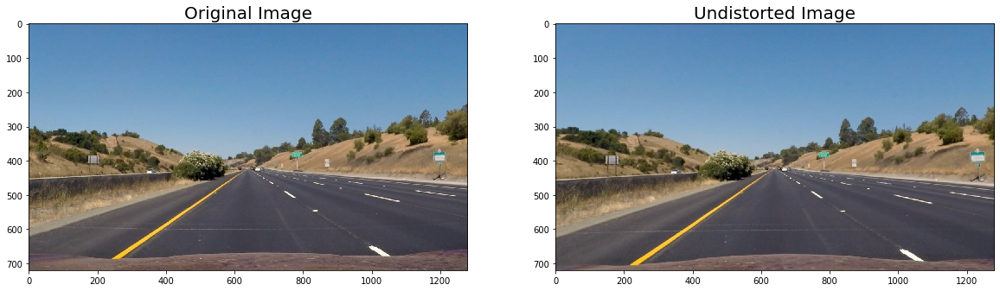

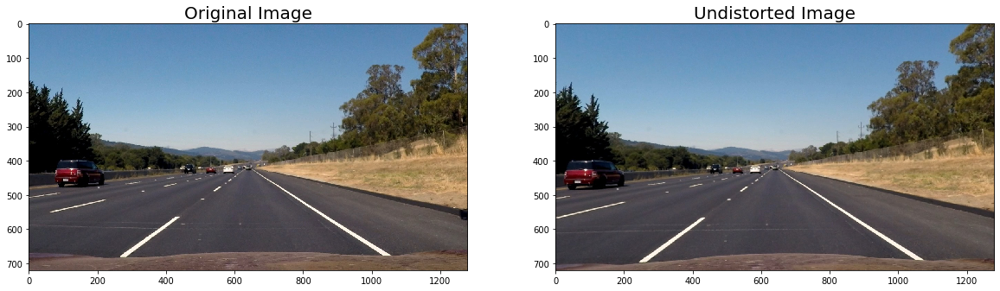

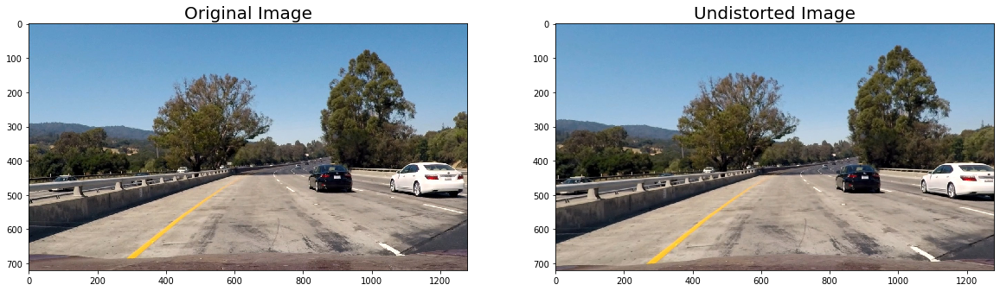

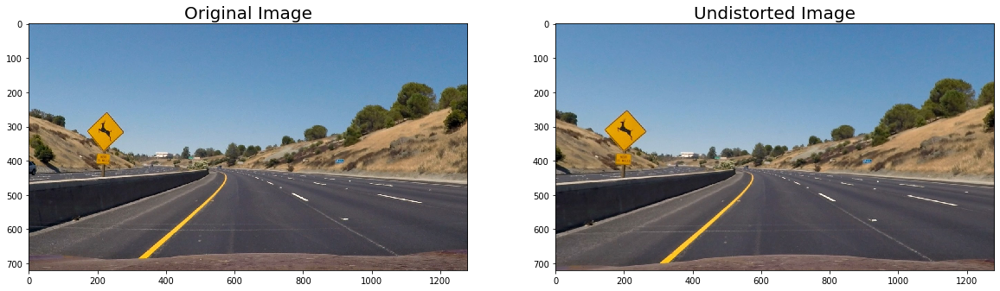

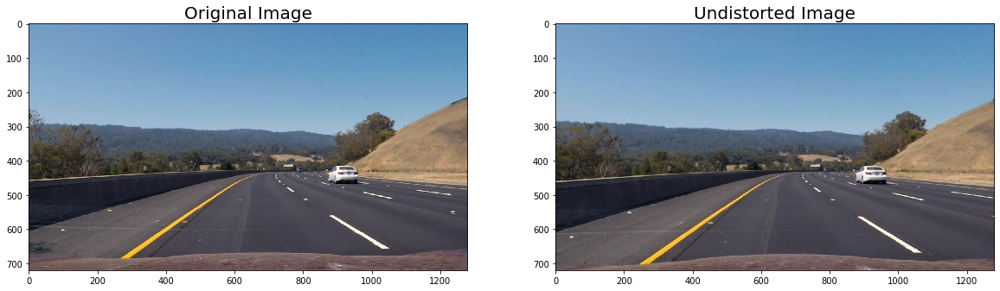

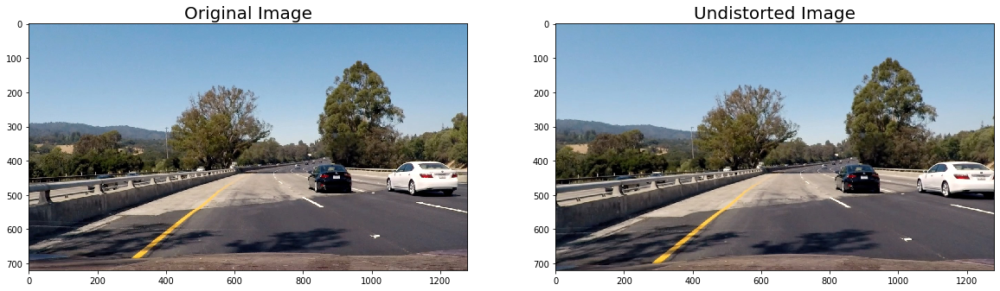

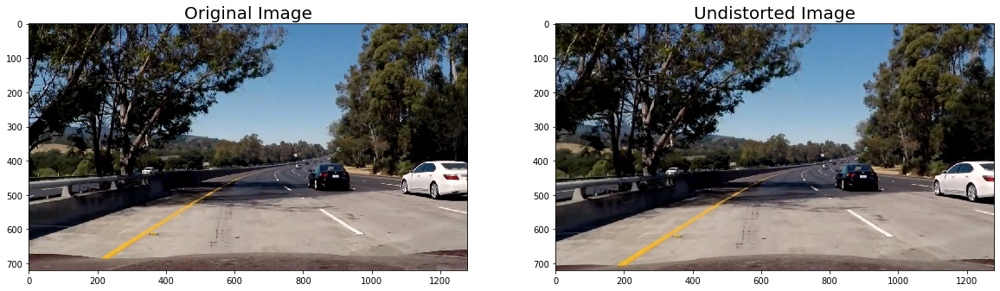

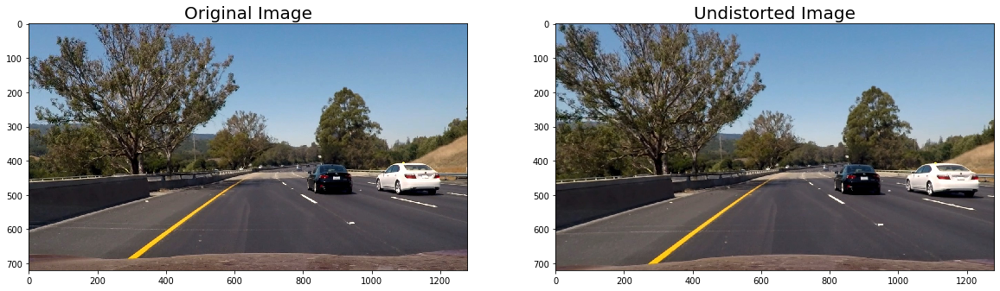

In [6]:
output_undistorted_img = os.path.join(output_images_dir, 'undistorted_test_images')
if not os.path.isdir(output_undistorted_img):
    os.makedirs(output_undistorted_img)
    
img_paths = glob.glob('./test_images/*.jpg')
for img_path_ in img_paths:
    img_fn = os.path.basename(img_path_)[:-4]
    img = mpimg.imread(img_path_)
    undistorted_img = undistort(img, mtx, dist)
    
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistorted_img)
    ax2.set_title('Undistorted Image', fontsize=20)
    plt.imsave(os.path.join(output_undistorted_img, 'undistorted_{}.jpg'.format(img_fn)), undistorted_img)
    plt.savefig(os.path.join(output_undistorted_img, 'both_{}.jpg'.format(img_fn)))

## Step III. Use color transforms, gradients, etc., to create a thresholded binary image.

In [7]:
def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(20, 100)):
    # Calculate directional gradient
    if orient == 'x':
        grad = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        grad = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Apply threshold

    grad = ((grad / np.max(grad)) * 255).astype(np.uint8)

    grad_binary = np.zeros_like(grad)
    grad_binary[(grad > thresh[0]) * (grad < thresh[1])] = 1
    return grad_binary


def mag_thresh(image, sobel_kernel=3, thresh=(30, 100)):
    # Calculate gradient magnitude
    grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    mag = np.sqrt(grad_x ** 2 + grad_y ** 2)
    # Apply threshold
    mag = ((mag / np.max(mag)) * 255).astype(np.uint8)
    mag_binary = np.zeros_like(mag)
    mag_binary[(mag > thresh[0]) * (mag < thresh[1])] = 1
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    grad_x = np.absolute(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    grad_y = np.absolute(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    direction = np.arctan2(grad_y, grad_x)
    dir_binary = np.zeros_like(direction, dtype=np.uint8)
    # Apply threshold
    dir_binary[(direction > thresh[0]) * (direction < thresh[1])] = 1
    return dir_binary

def get_binary_gradient_img(img, thresh_gradx=(20, 100), thresh_grady=(20, 100), thresh_mag=(30, 100), 
                   thresh_dir=(0.7, 1.3), ):
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    mask_gradx = abs_sobel_thresh(gray_img, orient='x', sobel_kernel=3, thresh=thresh_gradx)
    mask_grady = abs_sobel_thresh(gray_img, orient='y', sobel_kernel=3, thresh=thresh_grady)
    mask_mag = mag_thresh(gray_img, sobel_kernel=3, thresh=thresh_mag)
    mask_direction = dir_threshold(gray_img, sobel_kernel=15, thresh=thresh_dir)
    
    binary_output = np.zeros_like(mask_gradx)
    binary_output = ((mask_gradx == 1) & (mask_grady == 1)) | ((mask_mag == 1) & (mask_direction == 1))
    
    return binary_output

def get_binary_s_channel_img(img, thresh_s_channel=(170, 255)):
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls_img[:,:,2]
    binary_output = np.zeros_like(s_channel, dtype=np.uint8)
    binary_output[(s_channel > thresh_s_channel[0]) & (s_channel < thresh_s_channel[1])] = 1
    
    return binary_output

def get_binary_img(img, thresh_gradx=(20, 100), thresh_grady=(20, 100), thresh_mag=(30, 100), 
                       thresh_dir=(0.7, 1.3), thresh_s_channel=(170, 255)):
    grad_binary_output = get_binary_gradient_img(img, thresh_gradx, thresh_grady, thresh_mag, thresh_dir)
    s_channel_binary_output = get_binary_s_channel_img(img, thresh_s_channel)
    binary_output = grad_binary_output | s_channel_binary_output
    
    return binary_output

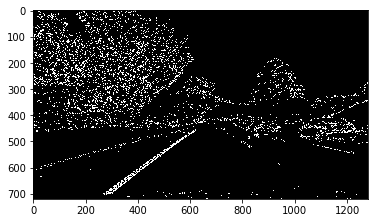

In [8]:
output_binary_img = os.path.join(output_images_dir, 'binary_test_images')
if not os.path.isdir(output_binary_img):
    os.makedirs(output_binary_img)
    
img_paths = glob.glob('./test_images/*.jpg')
for idx, img_path_ in enumerate(img_paths):
    img_fn = os.path.basename(img_path_)[:-4]
    img = mpimg.imread(img_path_)
    undistorted_img = undistort(img, mtx, dist)
    binary_output = get_binary_img(undistorted_img, thresh_gradx=(20, 100), thresh_grady=(20, 100), thresh_mag=(30, 100), 
                   thresh_dir=(0.7, 1.3), thresh_s_channel=(170, 255))
    plt.imshow(binary_output, cmap='gray')
    plt.imsave(os.path.join(output_binary_img, 'binary_{}.jpg'.format(img_fn)), binary_output, cmap='gray')

## Step IV. Apply a perspective transform to rectify binary image ("birds-eye view").

In [9]:
def warped_img(img):
    h, w = img.shape[:2]
    src = np.float32([
        [(w / 2) - 55, h / 2 + 100],
        [((w / 6) - 10), h],
        [(w * 5 / 6) + 60, h],
        [(w / 2 + 55), h / 2 + 100]
    ])
    dst = np.float32([
        [(w / 4), 0],
        [(w / 4), h],
        [(w * 3 / 4), h],
        [(w * 3 / 4), 0]
    ])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (w, h))
    
    draw_img = np.copy(img)
    draw_img = cv2.polylines(draw_img, [src.astype(np.int32)], True, (255, 0, 0))
    
    return warped, draw_img, M, Minv

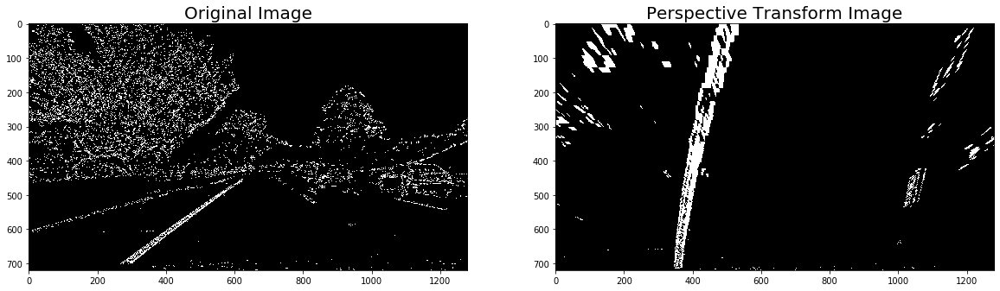

In [10]:
output_warped_img = os.path.join(output_images_dir, 'warped_test_images')
if not os.path.isdir(output_warped_img):
    os.makedirs(output_warped_img)
    
img_paths = glob.glob('./test_images/*.jpg')
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,10))

for idx, img_path_ in enumerate(img_paths):
    img_fn = os.path.basename(img_path_)[:-4]
    img = mpimg.imread(img_path_)
    undistorted_img = undistort(img, mtx, dist)
    binary_output = get_binary_img(undistorted_img, thresh_gradx=(20, 100), thresh_grady=(20, 100), thresh_mag=(30, 100), 
                   thresh_dir=(0.7, 1.3), thresh_s_channel=(170, 255))
    warped, draw_img, M, Minv = warped_img(undistorted_img)
    binary_warped, _ , M, Minv = warped_img(binary_output)
    
    ax1.imshow(draw_img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(warped)
    ax2.set_title('Perspective Transform Image', fontsize=20)
    plt.savefig(os.path.join(output_warped_img, 'color_{}.jpg'.format(img_fn)))
    
    ax1.imshow(binary_output, cmap='gray')
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(binary_warped, cmap='gray')
    ax2.set_title('Perspective Transform Image', fontsize=20)
    plt.savefig(os.path.join(output_warped_img, 'binary_{}.jpg'.format(img_fn)), cmap='gray')
    
#     plt.imsave(os.path.join(output_warped_img, 'warped_{}.jpg'.format(img_fn)), warped)
#     plt.imsave(os.path.join(output_warped_img, 'binary_warped_{}.jpg'.format(img_fn)), binary_warped, cmap='gray')    

## Step V. Detect lane pixels and fit to find the lane boundary.

In [110]:
# Using histogram --> finding peak at left and right
# Using sliding window method to find the curve
def find_lane_boundary(binary_warped):
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    h, w = binary_warped.shape[:2]
    half_below = binary_warped[int(h/2):, :]
    hist = np.sum(half_below, axis=0)
    left_x_peak = np.argmax(hist[:int(w/2)])
    right_x_peak = np.argmax(hist[int(w/2):]) + int(w/2)
    
    nwindows = 9
    margin = 100
    minpix = 50
    nonzeroxy = binary_warped.nonzero()
    nonzerox = nonzeroxy[1]
    nonzeroy = nonzeroxy[0]
    
    step_y = int(h / nwindows)
    left_x_cur = left_x_peak
    right_x_cur = right_x_peak
    
    left_lane_idexes = []
    right_lane_indexes = []
    for window_idx in range(nwindows):
#         print('left_x_cur: {}, right_x_cur: {}'.format(left_x_cur, right_x_cur))
        
        low_y = h - step_y * (window_idx + 1)
        high_y = h - step_y * window_idx
        low_left_x = left_x_cur - margin
        high_left_x = left_x_cur + margin
        low_right_x = right_x_cur - margin
        high_right_x = right_x_cur + margin
        
        cv2.rectangle(out_img, (low_left_x, low_y), (high_left_x, high_y), (0, 255, 0), 5)
        cv2.rectangle(out_img, (low_right_x, low_y), (high_right_x, high_y), (0, 255, 0), 5)
        
        
        left_lane_idx = ((nonzerox >= low_left_x) & (nonzerox < high_left_x) & (nonzeroy >= low_y) & (nonzeroy < high_y)).nonzero()[0]
        right_lane_idx = ((nonzerox >= low_right_x) & (nonzerox < high_right_x) & (nonzeroy >= low_y) & (nonzeroy < high_y)).nonzero()[0]
#         print('left_lane_idx: {}, right_lane_idx: {}'.format(left_lane_idx.shape, right_lane_idx.shape))
        
        if len(left_lane_idx) > minpix:
            left_x_cur = np.int(np.mean(nonzerox[left_lane_idx]))
        if len(right_lane_idx) > minpix:
            right_x_cur = np.int(np.mean(nonzerox[right_lane_idx]))
        left_lane_idexes.append(left_lane_idx)
        right_lane_indexes.append(right_lane_idx)
        
        
    try:
        left_lane_idexes = np.concatenate(left_lane_idexes)
        right_lane_indexes = np.concatenate(right_lane_indexes)
    except ValueError:
            pass
        
    left_lane_x = nonzerox[left_lane_idexes]
    left_lane_y = nonzeroy[left_lane_idexes]
    right_lane_x = nonzerox[right_lane_indexes]
    right_lane_y = nonzeroy[right_lane_indexes]
    
    out_img[left_lane_y, left_lane_x] = [255, 0, 0]
    out_img[right_lane_y, right_lane_x] = [0, 0, 255]
    
    return out_img, left_lane_x, left_lane_y, right_lane_x, right_lane_y

def fit_poly(left_lane_y, left_lane_x, right_lane_y, right_lane_x, h):
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    
    ploty = np.linspace(0, h - 1, h)
    
    try:
        left_fit_x = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
        right_fit_x = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    except TypeError:
        left_fit_x = ploty ** 2 + ploty
        right_fit_x = ploty ** 2 + ploty
    
    return left_fit, right_fit, left_fit_x, right_fit_x, ploty
    

def fit_polynomial(binary_warped):
    h, w = binary_warped.shape[:2]
    out_img, left_lane_x, left_lane_y, right_lane_x, right_lane_y = find_lane_boundary(binary_warped)
    
    left_fit, right_fit, left_fit_x, right_fit_x, ploty = fit_poly(left_lane_y, left_lane_x, right_lane_y, right_lane_x, h)
    
    return out_img, left_fit, right_fit, left_fit_x, right_fit_x, ploty

def search_around_poly(binary_warped):
    h, w = binary_warped.shape[:2]
    margin = 100
    nonzeroxy = binary_warped.nonzero()
    nonzerox = nonzeroxy[1]
    nonzeroy = nonzeroxy[0]
    
    out_img, left_fit, right_fit, left_fit_x, right_fit_x, ploty = fit_polynomial(binary_warped)
    left_lane_idx = (nonzerox >= left_fit_x - margin) & (nonzerox < left_fit_x + margin)
    right_lane_idx = (nonzerox >= right_fit_x - margin) & (nonzerox < right_fit_x + margin)
    
    left_lane_x = nonzerox[left_lane_idx]
    lef_lane_y = nonzeroy[left_lane_idx]
    right_lane_x = nonzerox[right_lane_idx]
    right_lane_y = nonzeroy[right_lane_idx]
    
    left_fit, right_fit, left_fit_x, right_fit_x, ploty = fit_poly(left_lane_y, left_lane_x, right_lane_y, right_lane_x, h)
    
    
    
    
    
    

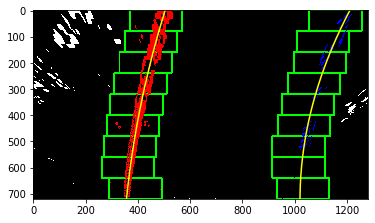

In [112]:
output_detectedline_img = os.path.join(output_images_dir, 'detected_lane_test_images')
if not os.path.isdir(output_detectedline_img):
    os.makedirs(output_detectedline_img)
    
img_paths = glob.glob('./test_images/*.jpg')

for idx, img_path_ in enumerate(img_paths):
    img_fn = os.path.basename(img_path_)[:-4]
    img = mpimg.imread(img_path_)
    undistorted_img = undistort(img, mtx, dist)
    binary_output = get_binary_img(undistorted_img, thresh_gradx=(20, 100), thresh_grady=(20, 100), thresh_mag=(30, 100), 
                   thresh_dir=(0.7, 1.3), thresh_s_channel=(170, 255))
    binary_warped, _ , M, Minv = warped_img(binary_output)

#     left_lane_x, left_lane_y, right_lane_x, right_lane_y, out_img = find_lane_boundary(binary_warped)
    out_img, left_fit, right_fit, left_fit_x, right_fit_x, ploty = fit_polynomial(binary_warped)
    plt.cla()
    plt.plot(left_fit_x, ploty, color='yellow')
    plt.plot(right_fit_x, ploty, color='yellow')
    plt.imshow(out_img)
    plt.savefig(os.path.join(output_detectedline_img, '{}.jpg'.format(img_fn)))
#   plt.imshow(binary_warped, cmap='gray')
        
    

## Step VI. Determine the curvature of the lane and vehicle position with respect to center.

In [105]:
def cal_curvature(binary_warped):
    h, w = binary_warped.shape[:2]
    left_lane_x, left_lane_y, right_lane_x, right_lane_y, out_img = lane_boundary(binary_warped)
    
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    
    ploty = np.linspace(0, h - 1, h)
    
    try:
        left_fit_x = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
        right_fit_x = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    except TypeError:
        left_fit_x = ploty ** 2 + ploty
        right_fit_x = ploty ** 2 + ploty
        
    y_eval = int(h / 2)
    left_curvature = np.sqrt((1 + (2 * left_fit[0] * y_eval + left_fit[1]) ** 2) ** 3) / np.absolute(2 * left_fit[0])
    right_curvature = np.sqrt((1 + (2 * right_fit[0] * y_eval + right_fit[1]) ** 2) ** 3) / np.absolute(2 * right_fit[0])
    
    return left_curvature, right_curvature
    

In [107]:
img_paths = glob.glob('./test_images/*.jpg')

for idx, img_path_ in enumerate(img_paths):
    img_fn = os.path.basename(img_path_)[:-4]
    img = mpimg.imread(img_path_)
    undistorted_img = undistort(img, mtx, dist)
    binary_output = get_binary_img(undistorted_img, thresh_gradx=(20, 100), thresh_grady=(20, 100), thresh_mag=(30, 100), 
                   thresh_dir=(0.7, 1.3), thresh_s_channel=(170, 255))
    binary_warped, _ , M, Minv = warped_img(binary_output)
    
    left_curvature, right_curvature = cal_curvature(binary_warped)
    print('left_curvature: {:.2f}, right_curvature: {:.2f}'.format(left_curvature, right_curvature))

left_curvature: 19247.53, right_curvature: 5845.11
left_curvature: 7395.77, right_curvature: 23488.43
left_curvature: 2355.50, right_curvature: 3103.08
left_curvature: 2231.38, right_curvature: 2088.35
left_curvature: 3436.15, right_curvature: 2966.15
left_curvature: 4991.36, right_curvature: 1379.98
left_curvature: 1820.70, right_curvature: 16749.63
left_curvature: 3650.97, right_curvature: 1531.03


## Step VII. Warp the detected lane boundaries back onto the original image.

In [ ]:
def unwarped(): 
    warped = cv2.warpPerspective(binary_warped, M, (w, h))
    


## Step VIII. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  